In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import glob
import cv2
from moviepy.editor import VideoFileClip

%matplotlib inline

In [2]:
def readImages(path):
    images = [cv2.imread(file) for file in glob.glob(path)]
    return images

In [94]:
def readVideo(file_name='../project_video.mp4'):
    images=[]
    clip = VideoFileClip(file_name)
    #success, images = clip.read()
    print(images.shape)
    return images

In [95]:
vid_frames = readVideo()

AttributeError: 'VideoFileClip' object has no attribute 'read'

In [4]:
    def stackImages(binary_img1,binary_img2):
        combined = np.dstack(( np.zeros_like(binary_img1), binary_img1, binary_img2)) * 255
        
#         combined = np.zeros_like(binary_img1)
#         print(binary_img1.shape)
#         combined[(binary_img1 == 1) | (binary_img2 == 1)] = 1
        return combined

In [100]:
class Camera(object):

    def __init__(self, images, chessboard_size):
        self.matrix = None
        self.dist = None
        self.calibrated_images = []
        self.failed_images = []
        self.calibrate(images, chessboard_size)

    def calibrate(self, images, chessboard_size):
        pattern = np.zeros((chessboard_size[1] * chessboard_size[0], 3), np.float32)
        pattern[:, :2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2)
        pattern_points = [] # points in real world image
        image_points = []   # points in image plane
        image_size = None

        # Loop through the images looking for chessboard corners
        for image in images:
            # convert to grayscale
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
            # find the chessboard corners
            f, corners = cv2.findChessboardCorners(gray, chessboard_size, None)
            # when corners found add object and image points
            if f:
                pattern_points.append(pattern)
                image_points.append(corners)
                image_size = (image.shape[1], image.shape[0])
                # draw corners
                cv2.drawChessboardCorners(image, chessboard_size, corners, True)
                self.calibrated_images.append(image)
            else:
                self.failed_images.append(image)

        # calibrate the camera if points were found
        if pattern_points and image_points:
            _, self.matrix, self.dist, _, _ = cv2.calibrateCamera(
                pattern_points, image_points,image_size, None, None
            )
    
    def undistort(self, image):
        if self.matrix is not None and self.dist is not None:
            return cv2.undistort(image, self.matrix, self.dist, None, self.matrix)
        else:
            return image

In [101]:
def calibrateCamera(images):
    calibrated_camera = Camera(images,(9,6))
    plt.figure(figsize=(12, 10))
    gridspec.GridSpec(5, 4)

    print('Corners detected:')
    # Loop through the images and look for the chessboard corners 
    for i, image, in enumerate(calibrated_camera.calibrated_images):
        plt.subplot2grid((5, 4), (i//4, i%4), colspan=1, rowspan=1)
        plt.imshow(calibrated_camera.undistort(image))
        plt.axis('off')
    plt.show()

    print('Unable to detect corners:')
    for i, image in enumerate(images):
        f, (x1, x2) = plt.subplots(1, 2, figsize=(25, 10))
        x1.axis('off')
        x1.imshow(image)
        x1.set_title('Original', fontsize=20)
        x2.axis('off')
        x2.imshow(calibrated_camera.undistort(image))
        x2.set_title('Calibrated', fontsize=20)
        
    return calibrated_camera

Corners detected:


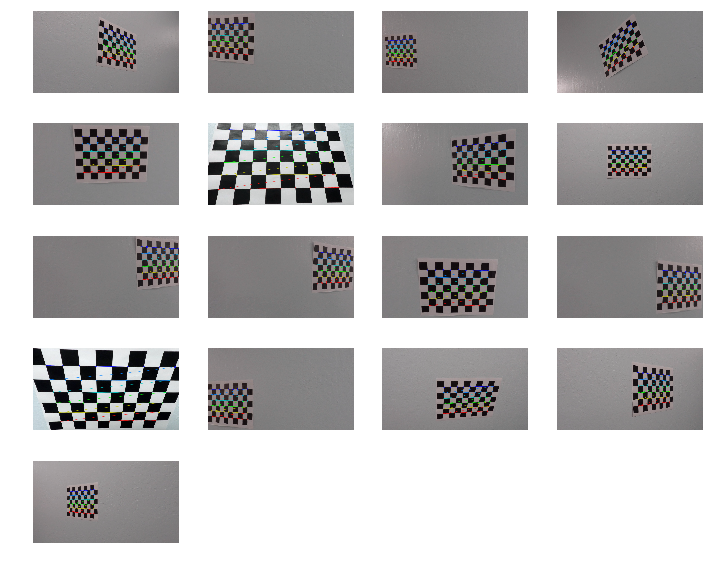

Unable to detect corners:


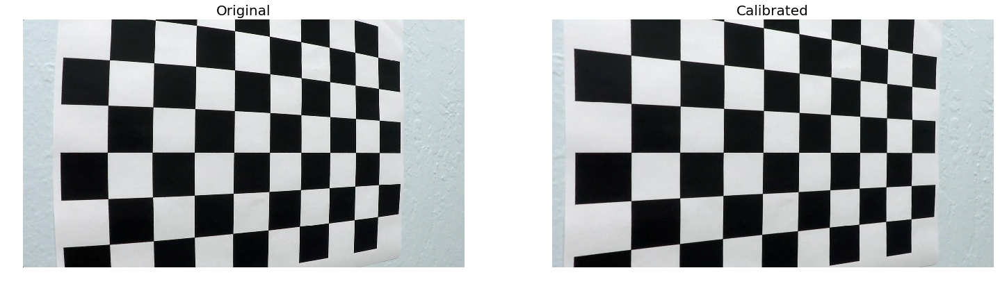

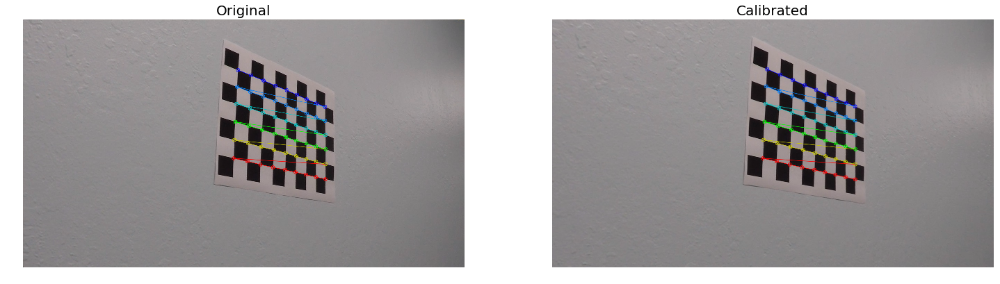

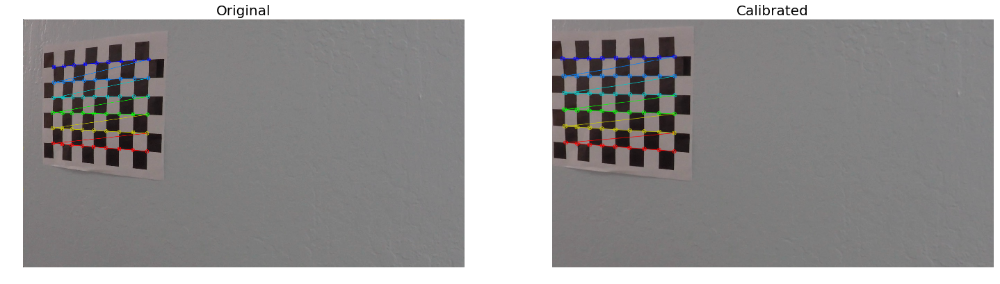

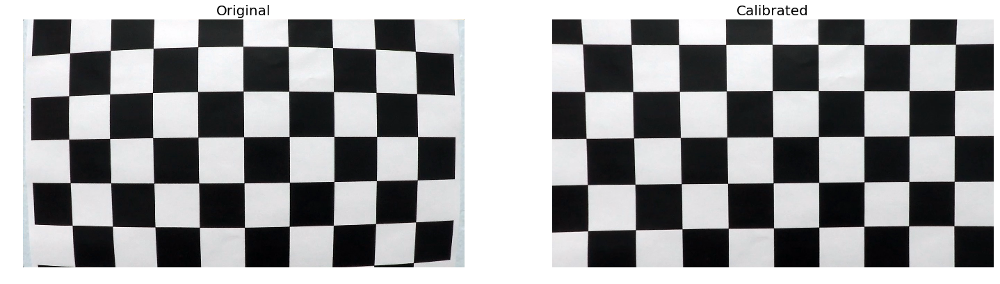

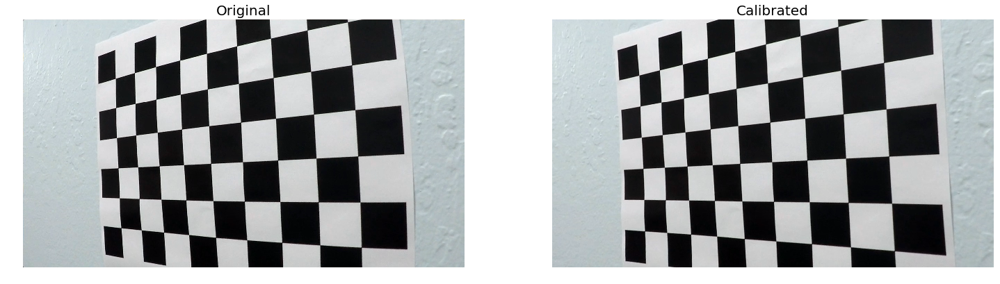

...

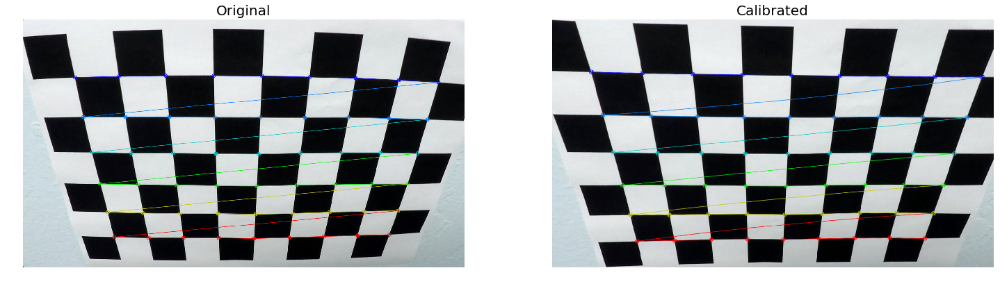

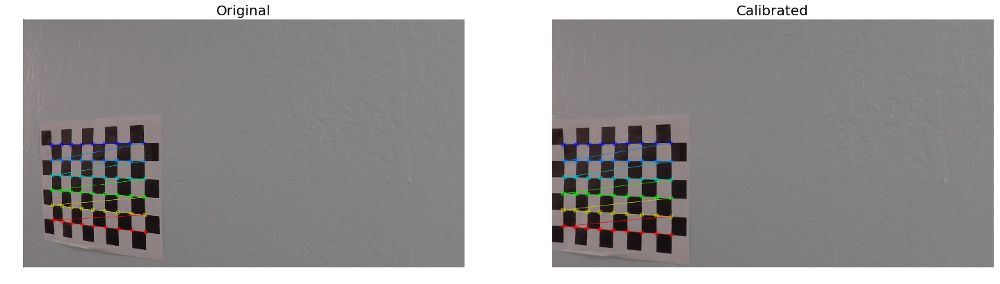

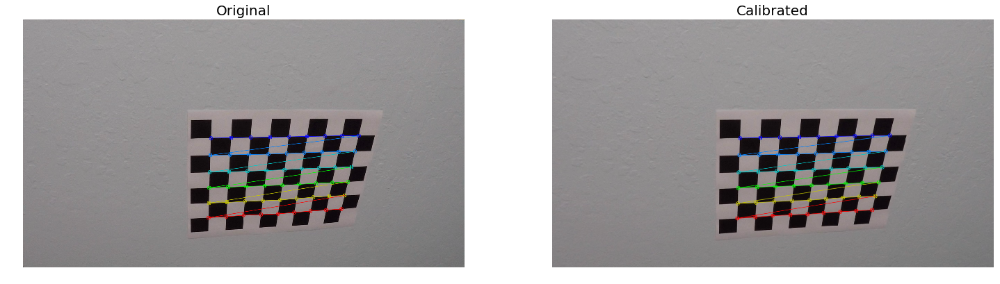

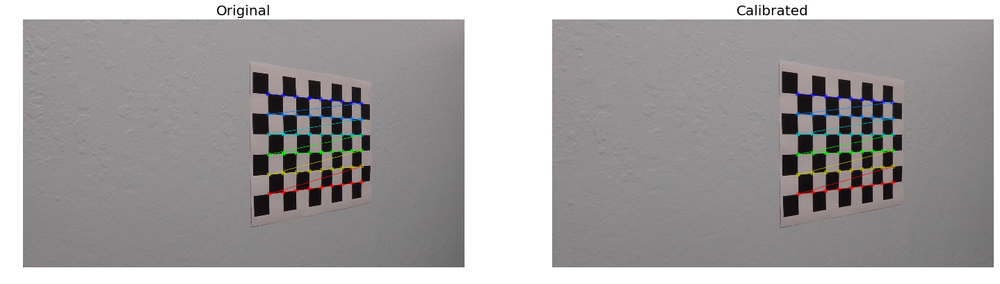

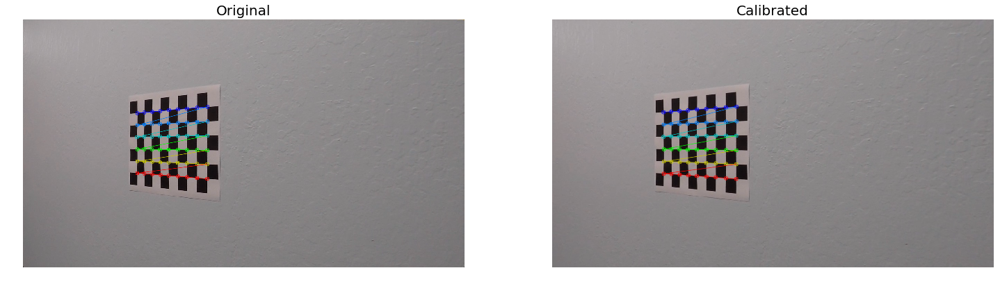

In [103]:
images = [cv2.imread(file) for file in glob.glob('../camera_cal/calibration*.jpg')]
calibrated_camera = calibrateCamera(images)

In [123]:
class preProcessImage(object):
    
    def __init__(self, image):
        self.image = image;
        self.img_width = image.shape[1]
        self.img_height = image.shape[0]
        self.sobelx_th = (20,100)
        self.sobely_th = (20,100)
        self.sobel_mag_th = (70,100)
        self.sobel_grad_th = (30,100)
        self.s_th = (170,255)
        self.s_th = (170,255)
        self.th_gray_img=self.cvt2Gray(image)
        self.th_hsv_img=self.cvt2HSV(image)
        self.th_hls_img=self.cvt2HLS(image)
        self.th_yuv_img=self.cvt2YUV(image)
        self.th_sobelx = self.cvt2Sobelx(image)
        self.th_sobely = self.cvt2Sobely(image)
        self.gradmag = []
        self.absgraddir = []
        self.roi = []   
        self.ax = []
        self.f = []
    
    def plot_images(self):
        plt.figure()
        self.f,self.ax = plt.subplots(1,8,figsize=(30,30))   

        self.ax[0].imshow(cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB))
        self.ax[0].title.set_text('image')
        self.ax[1].imshow(self.th_hls_img[:,:,0])
        self.ax[1].title.set_text('h-channel')
        self.ax[2].imshow(self.th_hls_img[:,:,1])
        self.ax[2].title.set_text('l-channel')
        self.ax[3].imshow(self.th_hls_img[:,:,2])
        self.ax[3].title.set_text('s-channel')
        self.ax[4].imshow(self.th_yuv_img[:,:,2])
        self.ax[4].title.set_text('v-channel')
        self.ax[5].imshow(self.th_yuv_img[:,:,1])
        self.ax[5].title.set_text('u-channel')
        self.ax[6].imshow(self.th_yuv_img[:,:,0])
        self.ax[6].title.set_text('y-channel')
        
        
    def getLanesRoi(self):
        x_center = self.img_width/2
        self.roi = np.array([[(0 + 50,self.img_height),
                              (x_center - 30, 50+self.img_height*1/2), 
                              (x_center + 30, 50+self.img_height*1/2), 
                              (self.img_width - 50,self.img_height)]], 
                            dtype=np.int32)

    def maskedImage(self,img=None, roi=None):
        """
        Applies an image mask.

        Only keeps the region of the image defined by the polygon
        formed from `vertices`. The rest of the image is set to black.
        `vertices` should be a numpy array of integer points.
        """
        if img is None :
            img = self.image
        
        if roi is None:
            self.getLanesRoi()
            vertices = self.roi
        else:
            vertices = roi
                
        #defining a blank mask to start with
        mask = np.zeros_like(img)   

        #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
        if len(img.shape) > 2:
            channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
            ignore_mask_color = (255,) * channel_count
        else:
            ignore_mask_color = 255

        #filling pixels inside the polygon defined by "vertices" with the fill color    
        cv2.fillPoly(mask, np.array([vertices], dtype=np.int32), ignore_mask_color)

        #returning the image only where mask pixels are nonzero
        masked_image = cv2.bitwise_and(img, mask)
        return masked_image
    
    def binaryThresh(self, channel, thresh):
        binary = np.zeros_like(channel)
        binary[(channel > thresh[0]) & (channel <= thresh[1])] = 1
        return binary
    
    def cvt2Gray(self,img):
        return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    def cvt2HSV(self,img):
        return cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        
    def cvt2HLS(self,img):
        return cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
        
    def cvt2YUV(self,img):
        return cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    
    def cvt2Sobelx(self,img):
        gray = self.cvt2Gray(img)
        return cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    
    def cvt2Sobely(self,img):
        gray = self.cvt2Gray(img)
        return cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    def thresholdSobelx(self):
        abs_sobelx = np.absolute(self.th_sobelx) # Absolute x derivative to accentuate lines away from horizontal
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
        self.th_sobelx = self.binaryThresh(scaled_sobel, self.sobelx_th)

    def thresholdSobely(self):
        abs_sobely = np.absolute(self.th_sobely) # Absolute x derivative to accentuate lines away from horizontal
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
        self.th_sobely = self.binaryThresh(scaled_sobel, self.sobely_th)
        
    def sobelGradMag(self):
        gradmag = np.sqrt(self.th_sobelx**2 + self.th_sobely**2)
        scale_factor = np.max(gradmag)/255 
        self.gradmag = (gradmag/scale_factor).astype(np.uint8) 
        self.absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))

    
    def thresholdSobelMag(self):
        self.gradmag = self.binaryThresh(self.gradmag, self.mag_thresh)
        
    def thresholdSobelgrad(self):
        self.dir_binary = self.binaryThresh(self.absgraddir, self.dir_thresh)
        
    def filterWhiteYellow(self):

        #Filter white
        threshold = 200 
        high_threshold = np.array([255, 255, 255]) #Bright white
        low_threshold = np.array([threshold, threshold, threshold]) #Soft White
        mask = cv2.inRange(image, low_threshold, high_threshold)
        white_img = cv2.bitwise_and(self.image, self.image, mask=mask)

        # Filter Yellow
        high_threshold = np.array([200,255,255]) #Bright Yellow
        low_threshold = np.array([50,50,50]) #Soft Yellow   
        mask = cv2.inRange(self.th_hsv_img, low_threshold, high_threshold)
        yellow_img = cv2.bitwise_and(self.image, self.image, mask=mask)

        # Combine the two above images
        filtered_img = cv2.addWeighted(white_img, 1., yellow_img, 1., 0.)

        return filtered_img
         
    def processThreshold(self):
        white_yellow_img = self.filterWhiteYellow()
        self.thresholdSobelx()
        s_binary = self.binaryThresh(self.th_hls_img[:,:,2], self.s_th)
        u_binary = self.binaryThresh(self.th_yuv_img[:,:,1], (0,100))
        combined =  stackImages(self.th_sobelx, s_binary)
        print(combined.shape)
        print( white_yellow_img.shape)
#         masked = self.maskedImage(self.image)
#         self.ax[7].imshow(cv2.cvtColor(masked,cv2.COLOR_BGR2RGB))
#         self.ax[7].title.set_text("Stacked")



        return white_yellow_img

(409, 720, 3)
(409, 720, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(683, 910, 3)
(683, 910, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(280, 390, 3)
(280, 390, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(986, 1300, 3)
(986, 1300, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)


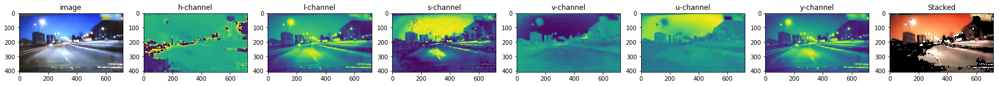

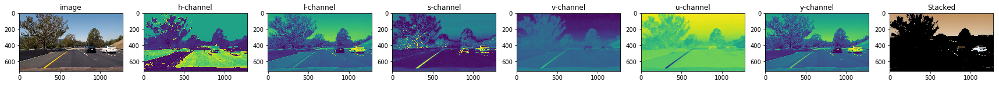

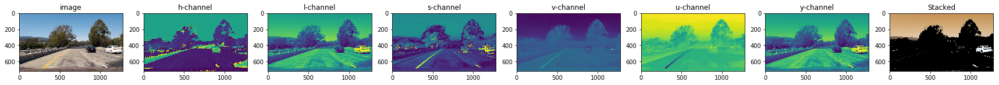

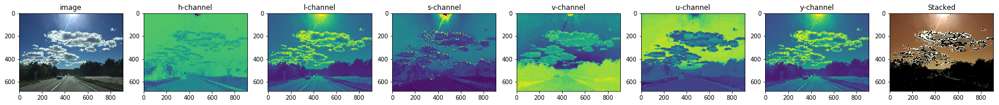

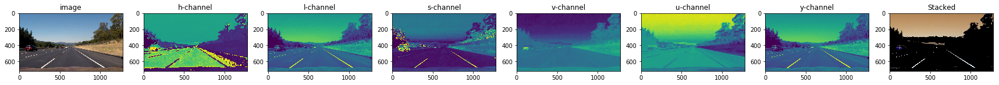

...

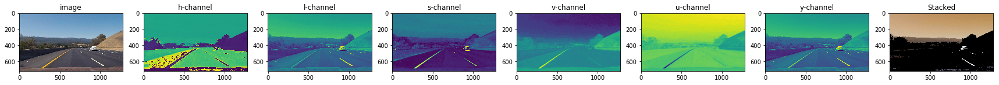

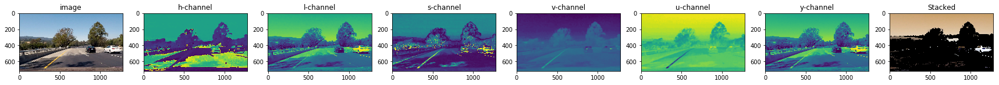

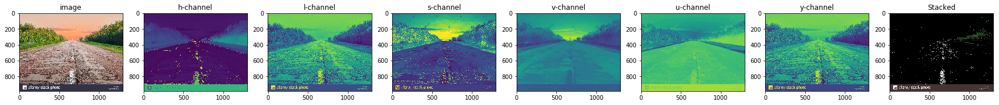

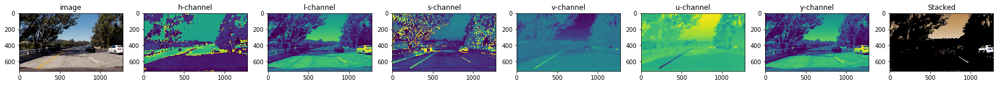

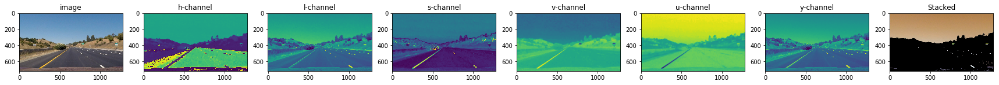

In [126]:
road_imgs = readImages('../test_images/*.jpg')
for image in road_imgs:
    processed_frame = preProcessImage(image)
    processed_frame.plot_images()
    binary_th = processed_frame.processThreshold()
    processed_frame.ax[7].imshow(binary_th)
    processed_frame.ax[7].title.set_text("Stacked")
#     plt.imshow(binary_th)
#     plt.title.set_text("Stacked")


    

In [114]:
class transformImage(object):
    
    def __init__(self,image):
        self.image              = image
        self.img_size           = (image.shape[0], image.shape[1])
        self.img_height         = image.shape[1]
        self.img_width          = image.shape[0]
        self.bottom_width       = 0.4
        self.top_width          = 0.096
        self.height             = 0.4
        self.car_hood           = 45
        self.src_coordinates    = []
        self.dst_coordinates    = []
        self.transform_mtx      = []
        self.inv_transform_mtx  = []
        self.img_shape          = (image.shape[0], image.shape[1])
    
    def orderPoints(self,pts):
        mx = np.sum(pts.T[0]/len(pts))
        my = np.sum(pts.T[1]/len(pts))

        l = []
        for i in range(len(pts)):
            l.append(  (np.math.atan2(pts.T[0][i] - mx, pts.T[1][i] - my) + 2 * np.pi + 0.5 * np.pi) % (2*np.pi)  )
        sort_idx = np.argsort(l)

        return pts[sort_idx[::-1]]

    def getPerspectiveTransformMtx(self):
        self.getSrcTransformCoordinates(self.bottom_width, self.top_width, self.height, self.car_hood)
        self.getDstTransformCoordinates()
#         print('Src coordinates: ', self.src_coordinates)
#         print('Dst coordinates: ', self.dst_coordinates)
        
#         img = preProcessImage(self.image)
#         masked_img = img.maskedImage(self.image, self.src_coordinates)
#         plt.imshow(cv2.cvtColor(masked_img,cv2.COLOR_BGR2RGB))
        
        self.transform_mtx = cv2.getPerspectiveTransform(self.src_coordinates, self.dst_coordinates)
        self.inv_transform_mtx = cv2.getPerspectiveTransform(self.dst_coordinates, self.src_coordinates)
     
    def getSrcTransformCoordinates(self, bottom_width,top_width,height, car_hood):
        imshape = self.img_size        
        self.src_coordinates = np.array([[\
        ((imshape[1] * (1 - bottom_width)) // 2, imshape[0]-car_hood),\
        ((imshape[1] * (1 - top_width)) // 2, imshape[0] - imshape[0] * height + car_hood),\
        (imshape[1] - (imshape[1] * (1 - top_width)) // 2, imshape[0] - imshape[0] * height + car_hood),\
        (imshape[1] - (imshape[1] * (1 - bottom_width)) // 2, imshape[0] - car_hood)]]\
        , dtype=np.int32)

        
        self.src_coordinates = self.src_coordinates.reshape(self.src_coordinates.shape[1:])
        self.src_coordinates = self.src_coordinates.astype(np.float32)
        self.src_coordinates = self.orderPoints(self.src_coordinates)
        
    def getDstTransformCoordinates(self):
        offset = 200
        self.dst_coordinates = np.float32([[offset, offset], [self.img_size[0]-offset, offset], 
                                     [self.img_size[0]-offset, self.img_size[1]], 
                                     [offset, self.img_size[1]]])
                                           
            
        
        
    def __call__(self,image=None):
        self.getPerspectiveTransformMtx()
        if image is None:
            image = self.image
        warped = cv2.warpPerspective(image, self.transform_mtx, self.img_size)
        return warped 

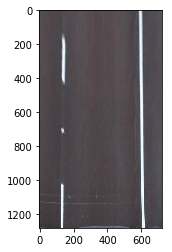

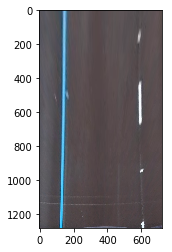

In [115]:
road_imgs = readImages('../test_images/straight_lines*.jpg')

for image in road_imgs:
    warped = transformImage(image)
    transformed = warped()
    plt.figure()
    plt.imshow(transformed)

(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)


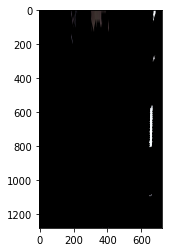

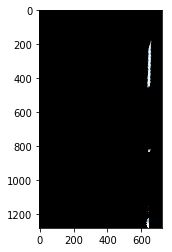

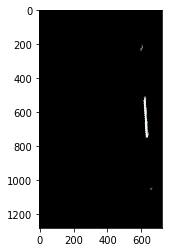

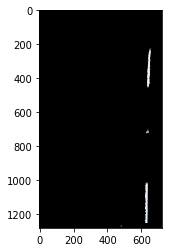

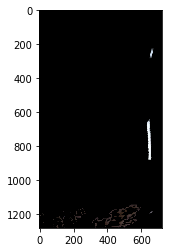

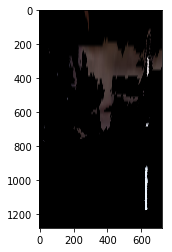

In [124]:
road_imgs = readImages('../test_images/test*.jpg')
count = 1
for image in road_imgs:
    undistorted_img = calibrated_camera.undistort(image)

    processed_frame = preProcessImage(undistorted_img)
    binary_th = processed_frame.processThreshold()
    transformed = warped(binary_th)
    plt.figure(count)
    plt.imshow(transformed)
    count = count + 1